# po2rix-1 - ResNet18 baseline y fine-tuning

**PARTE 1** 
— ResNet 18 entrenada y sin fine-tuning  

**Objetivo:** : Tener ResNet 18 entrenada y sin fine-tuning, con métricas documentadas y curvas de entrenamiento comparadas

---

### Plan de trabajo

**Día 1 - Configuración del entorno + Carga del dataset**

- Instalar y configurar entorno del Miniconda: Pytorch, PyTorch Lightning, torchvision, Matplotlib, scikit-learn
- Cargar el dataset preprocesado del Grupo 1 y adaptarlo a la estructura de carpetas PyTorch (ImageFolder)
- Implementar el DataLoader con transformaciones básicas (resize , normalización ImageNet)
- Verificar que el pipeline de datos funciona : mostrar un batch de imágenes con sus etiquetas
- Documentar la arquitectura del dataset: clases, distribución de muestras por split (train/val/test)

**Día 2 - ResNet18 preentrenado sin fine-tuning: baseline**

- Cargar ResNet18 preentrenada desde torchvision.models con pesos ImageNet
- Reemplazar la capa final (fc) para adaptarla al número de clases del proyecto
- Congelar todos los parámetros excepto la capa final (feature extraction)
- Entrenar durante 10 épocas y registrar loss y accuracy en train y validación
- Generar y guardar la matriz de confusión y el informe de clasificación (precisión, recall, F1)

**DÍA 3 - Fine-tuning de ResNet18**

- Descongelar todos los parámetros del modelo para habilitar el fine-tuning completo
- Ajustar la tasa de aprendizaje diferenciada: Ir bajo para capas preentrenadas, Ir más alto para la capa final
- Entrenar durante 15-20 épocas con early stopping y guardar el mejor checkpoint (2h)
- Generar curvas de entrenamiento (loss y accuracy) comparando baseline vs fine-tuning
- Guardar el modelo entrenado en formato .pt para su uso posterior en el agente

**Día 4 — Análisis de resultados + inicio publicación web**

- Evaluar ambos modelos (baseline y fine-tuning) sobre el set de test con métricas completas
- Analizar los errores más frecuentes: ¿qué imágenes clasifica mal el modelo y por qué?
- Redactar el informe técnico comparativo baseline vs fine-tuning en Markdown
- Redactar el borrador de la publicación web: "ResNet18 y fine-tuning: qué aprendimos"


## 1 · Importaciones

In [49]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from pathlib import Path
import time, copy, warnings
warnings.filterwarnings("ignore")

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from torchvision.models import ResNet18_Weights
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, balanced_accuracy_score, confusion_matrix,
)
from PIL import Image

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Dispositivo: {device}")


Dispositivo: cpu


## 2 · Configuración general

In [50]:
# ── Rutas ────────────────────────────────────────────────────────────────────
DATA_DIR  = Path("imagenes_procesadas")
CLASES    = ["si", "no"]
LABEL2IDX = {"si": 0, "no": 1}
IDX2LABEL = {0: "si", 1: "no"}

# ── Reproducibilidad (idéntica al notebook clásico) ───────────────────────────
SEED      = 42
TEST_SIZE = 0.20

# ── Hiperparámetros de entrenamiento ─────────────────────────────────────────
IMG_SIZE     = 224           # ResNet espera 224×224
BATCH_SIZE   = 16
NUM_WORKERS  = 0             # 0 = hilo principal (seguro en notebooks)

EPOCHS_PURO  = 30           # epochs para modelo de serie sin entrenar nada (zero-shot)
EPOCHS_FE    = 10           # epochs para Feature Extraction (cabeza congelada)
EPOCHS_FT    = 20           # epochs adicionales para Fine-Tuning

LR_FE        = 1e-3          # lr cabeza lineal
LR_FT        = 1e-6          # lr fino (capas descongeladas)
LR_FT_HEAD   = 1e-5          # lr de la cabeza durante fine-tuning

torch.manual_seed(SEED)
np.random.seed(SEED)


## 3 · Cargar dataset y hacer split

Total imágenes: 71
label
si    37
no    34
Name: count, dtype: int64


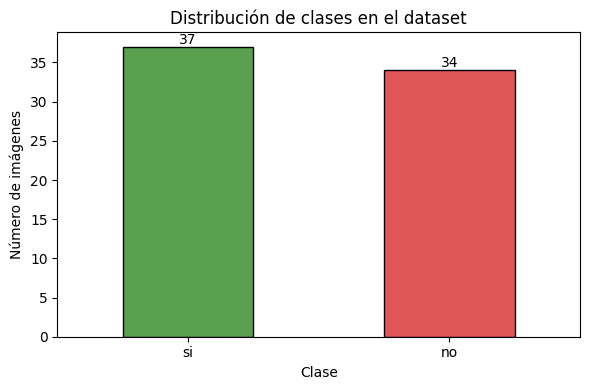


→ Clases con menos de 100 muestras pueden beneficiarse de data augmentation.


In [51]:
records = []
for clase in CLASES:
    carpeta = DATA_DIR / clase
    if not carpeta.exists():
        print(f"[AVISO] Carpeta no encontrada: {carpeta}")
        continue
    for img_path in sorted(carpeta.glob("*")):
        if img_path.suffix.lower() in (".jpg", ".jpeg", ".png", ".bmp"):
            records.append({
                "path"  : str(img_path),
                "label" : clase,
                "idx"   : LABEL2IDX[clase],
                "fname" : img_path.name,
            })

df = pd.DataFrame(records)
print(f"Total imágenes: {len(df)}")
print(df["label"].value_counts())


# ── Análisis de distribución de clases ───────────────────────────────────────
fig, ax = plt.subplots(figsize=(6, 4))
df["label"].value_counts().plot(kind="bar", ax=ax, color=["#59a14f", "#e15759"], edgecolor="black")
ax.set_title("Distribución de clases en el dataset", fontsize=12)
ax.set_xlabel("Clase")
ax.set_ylabel("Número de imágenes")
ax.tick_params(axis="x", rotation=0)
for p in ax.patches:
    ax.annotate(f"{int(p.get_height())}", (p.get_x() + p.get_width() / 2, p.get_height()),
                ha="center", va="bottom")
plt.tight_layout()
plt.show()
print("\n→ Clases con menos de 100 muestras pueden beneficiarse de data augmentation.")


In [52]:
# ── Split principal  ───────────────────────────────
df_train, df_test = train_test_split(
    df, test_size=TEST_SIZE, random_state=SEED,
    stratify=df["label"], shuffle=True,
)
# Split de validación (del train)
df_tr, df_val = train_test_split(
    df_train, test_size=0.20, random_state=SEED,
    stratify=df_train["label"],
)
df_tr  = df_tr.reset_index(drop=True)
df_val = df_val.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)

print(f"\nTrain: {len(df_tr)}  |  Val: {len(df_val)}  |  Test: {len(df_test)}")



Train: 44  |  Val: 12  |  Test: 15


## 4 · Transforms y Dataset de PyTorch

In [53]:
IMAGENET_MEAN = [0.485, 0.456, 0.406] 
IMAGENET_STD  = [0.229, 0.224, 0.225]

transforms_train = transforms.Compose([
    transforms.Resize((IMG_SIZE + 32, IMG_SIZE + 32)),
    transforms.RandomCrop(IMG_SIZE), # --> Se deberia de retirar el crop
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD), #-->normalizacion ImageNet
])
transforms_eval = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD), #-->normalizacion ImageNet
])

class DedoDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row   = self.df.iloc[idx]
        img   = Image.open(row["path"]).convert("RGB")
        label = row["idx"]
        if self.transform:
            img = self.transform(img)
        return img, label, row["path"]

def make_loaders(df_tr, df_val, df_test):
    dl_train = DataLoader(DedoDataset(df_tr,   transforms_train),
                          batch_size=BATCH_SIZE, shuffle=True,  num_workers=NUM_WORKERS)
    dl_val   = DataLoader(DedoDataset(df_val,  transforms_eval),
                          batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)
    dl_test  = DataLoader(DedoDataset(df_test, transforms_eval),
                          batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)
    return dl_train, dl_val, dl_test

dl_train, dl_val, dl_test = make_loaders(df_tr, df_val, df_test)
print(f"Batches — train: {len(dl_train)}  val: {len(dl_val)}  test: {len(dl_test)}")


Batches — train: 3  val: 1  test: 1


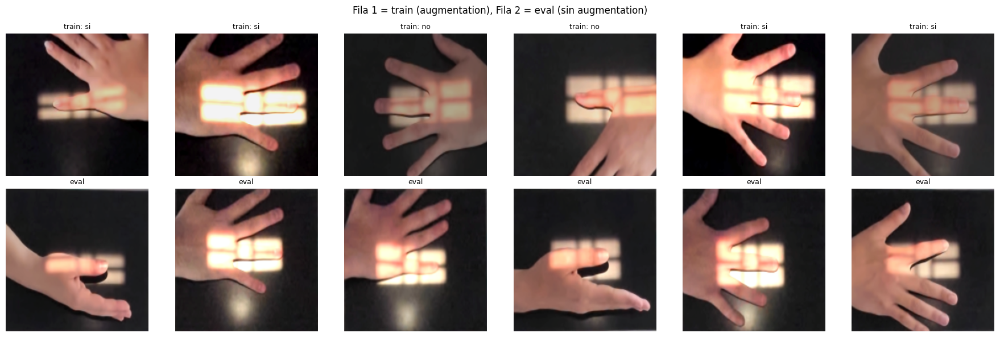

In [54]:


# Función para desnormalizar imágenes
def denorm(img_tensor):
    img = img_tensor.permute(1, 2, 0).numpy()

    img = (img * np.array(IMAGENET_STD)) + np.array(IMAGENET_MEAN)
    img = np.clip(img, 0, 1)

    return img

fig, axes = plt.subplots(2, 6, figsize=(18, 6))

for col in range(6):

    # =========================
    # TRAIN (con augmentation)
    # =========================
    row_tr = df_tr.iloc[col]

    img_t = Image.open(row_tr["path"]).convert("RGB")
    img_t = transforms_train(img_t)

    lbl = row_tr["idx"]

    axes[0, col].imshow(denorm(img_t))
    axes[0, col].set_title(
        f"train: {IDX2LABEL[lbl]}",
        fontsize=9
    )
    axes[0, col].axis("off")

    # =========================
    # EVAL / TEST
    # =========================
    row_te = df_test.iloc[col]

    img_e = Image.open(row_te["path"]).convert("RGB")
    img_e = transforms_eval(img_e)

    axes[1, col].imshow(denorm(img_e))
    axes[1, col].set_title(
        "eval",
        fontsize=9
    )
    axes[1, col].axis("off")

plt.suptitle(
    "Fila 1 = train (augmentation), Fila 2 = eval (sin augmentation)",
    fontsize=12
)

plt.tight_layout()
plt.show()

In [55]:
# Verificar batches de train, val y test
for loader_name, loader in [("train (baseline)",  dl_train),
                             ("train (aug)",      dl_train),
                             ("val",              dl_val),
                             ("test",             dl_test)]:
    images, labels, paths = next(iter(loader))
    print(f"{loader_name:20s} — imágenes: {images.shape}  labels: {labels.shape}")

print("\nPipeline de datos verificado")

train (baseline)     — imágenes: torch.Size([16, 3, 224, 224])  labels: torch.Size([16])
train (aug)          — imágenes: torch.Size([16, 3, 224, 224])  labels: torch.Size([16])
val                  — imágenes: torch.Size([12, 3, 224, 224])  labels: torch.Size([12])
test                 — imágenes: torch.Size([15, 3, 224, 224])  labels: torch.Size([15])

Pipeline de datos verificado


## 5 · Funciones auxiliares compartidas

In [56]:
# ── Loop de entrenamiento ─────────────────────────────────────────────────────
def entrenar(model, dl_train, dl_val, optimizer, criterion, epochs, scheduler=None,
             patience=7, min_delta=1e-4):
             
    best_wts     = copy.deepcopy(model.state_dict())
    best_val_acc = 0.0
    history      = {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []}

    # ── Early stopping ────────────────────────────────────────────────────────
    es_counter   = 0          # épocas sin mejora
    stopped_at   = epochs     # para reportar cuándo paró

    for epoch in range(1, epochs + 1):
        t0 = time.time()
        for phase, dl in [("train", dl_train), ("val", dl_val)]:
            model.train() if phase == "train" else model.eval()
            running_loss = running_correct = total = 0

            for imgs, labels, _ in dl:
                imgs, labels = imgs.to(device), labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == "train"):
                    out   = model(imgs)
                    loss  = criterion(out, labels)
                    preds = out.argmax(dim=1)
                    if phase == "train":
                        loss.backward(); optimizer.step()
                running_loss    += loss.item() * imgs.size(0)
                running_correct += (preds == labels).sum().item()
                total           += imgs.size(0)

            ep_loss = running_loss / total
            ep_acc  = running_correct / total
            history[f"{phase}_loss"].append(ep_loss)
            history[f"{phase}_acc"].append(ep_acc)

            if phase == "val":
                if ep_acc > best_val_acc + min_delta:
                    best_val_acc = ep_acc
                    best_wts     = copy.deepcopy(model.state_dict())
                    es_counter   = 0        # reset contador
                else:
                    es_counter  += 1        # sin mejora

        if scheduler: scheduler.step()
        print(f"  [{epoch:3d}/{epochs}]  "
              f"train {history['train_acc'][-1]:.3f}/{history['train_loss'][-1]:.4f}  "
              f"val {history['val_acc'][-1]:.3f}/{history['val_loss'][-1]:.4f}  "
              f"ES:{es_counter}/{patience}  ({time.time()-t0:.1f}s)")

        # ── Comprobar early stopping ──────────────────────────────────────────
        if es_counter >= patience:
            stopped_at = epoch
            print(f"  ⏹  Early stopping en época {epoch}  (sin mejora en {patience} épocas)")
            break

    print(f"  → Mejor val_acc: {best_val_acc:.3f}  |  Parado en época {stopped_at}/{epochs}")
    model.load_state_dict(best_wts)
    return model, history

# ── Evaluación en test ────────────────────────────────────────────────────────
def evaluar(model, dl_test):
    model.eval()
    all_preds, all_labels, all_paths = [], [], []
    with torch.no_grad():
        for imgs, labels, paths in dl_test:
            preds = model(imgs.to(device)).argmax(dim=1).cpu().numpy()
            all_preds.extend(preds)
            all_labels.extend(labels.numpy())
            all_paths.extend(paths)
    y_true = [IDX2LABEL[l] for l in all_labels]
    y_pred = [IDX2LABEL[p] for p in all_preds]
    return y_true, y_pred, all_paths

def metricas_dict(nombre, y_true, y_pred):
    return {
        "Modelo"            : nombre,
        "Accuracy"          : accuracy_score(y_true, y_pred),
        "Balanced Acc."     : balanced_accuracy_score(y_true, y_pred),
        "Precision (si)"    : precision_score(y_true, y_pred, pos_label="si", zero_division=0),
        "Recall (si)"       : recall_score(y_true, y_pred, pos_label="si", zero_division=0),
        "F1 (si)"           : f1_score(y_true, y_pred, pos_label="si", zero_division=0),
    }


Shape batch imágenes: torch.Size([16, 3, 224, 224])
Shape labels: torch.Size([16])


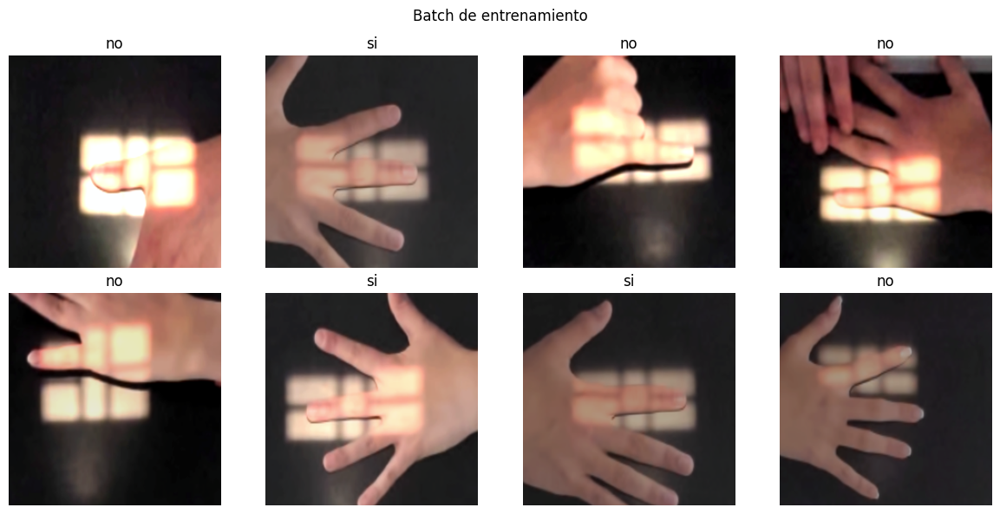

In [57]:

# Obtener un batch del DataLoader
images, labels, paths = next(iter(dl_train))

print("Shape batch imágenes:", images.shape)
print("Shape labels:", labels.shape)

# Mostrar primeras 8 imágenes
fig, axes = plt.subplots(2, 4, figsize=(12, 6))

for i, ax in enumerate(axes.flat):

    img = denorm(images[i])

    label_idx = labels[i].item()
    label_name = IDX2LABEL[label_idx]

    ax.imshow(img)
    ax.set_title(label_name)
    ax.axis("off")

plt.suptitle("Batch de entrenamiento")
plt.tight_layout()
plt.show()

Shape batch imágenes: torch.Size([12, 3, 224, 224])
Shape labels: torch.Size([12])


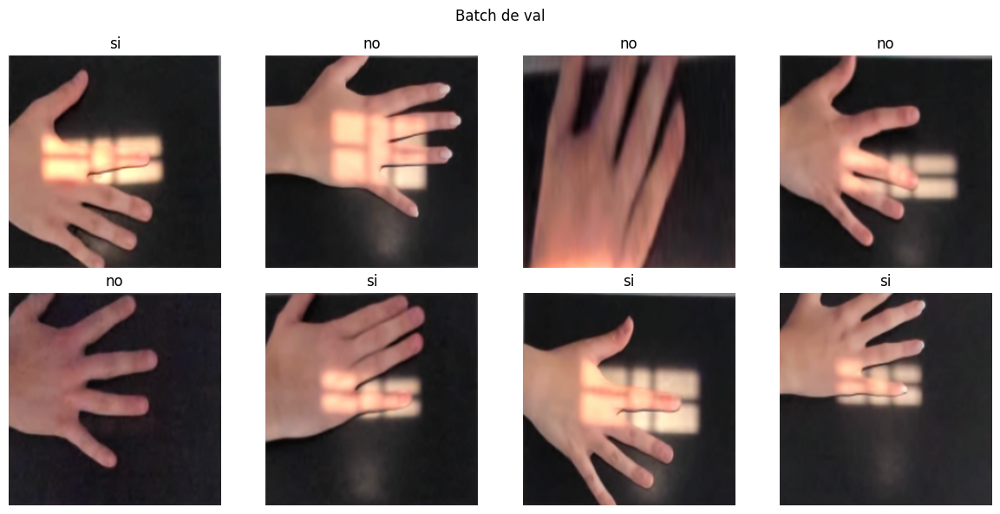

In [58]:

# Obtener un batch del DataLoader
images, labels, paths = next(iter(dl_val))

print("Shape batch imágenes:", images.shape)
print("Shape labels:", labels.shape)

# Mostrar primeras 8 imágenes
fig, axes = plt.subplots(2, 4, figsize=(12, 6))

for i, ax in enumerate(axes.flat):

    img = denorm(images[i])

    label_idx = labels[i].item()
    label_name = IDX2LABEL[label_idx]

    ax.imshow(img)
    ax.set_title(label_name)
    ax.axis("off")

plt.suptitle("Batch de val")
plt.tight_layout()
plt.show()

Shape batch imágenes: torch.Size([15, 3, 224, 224])
Shape labels: torch.Size([15])


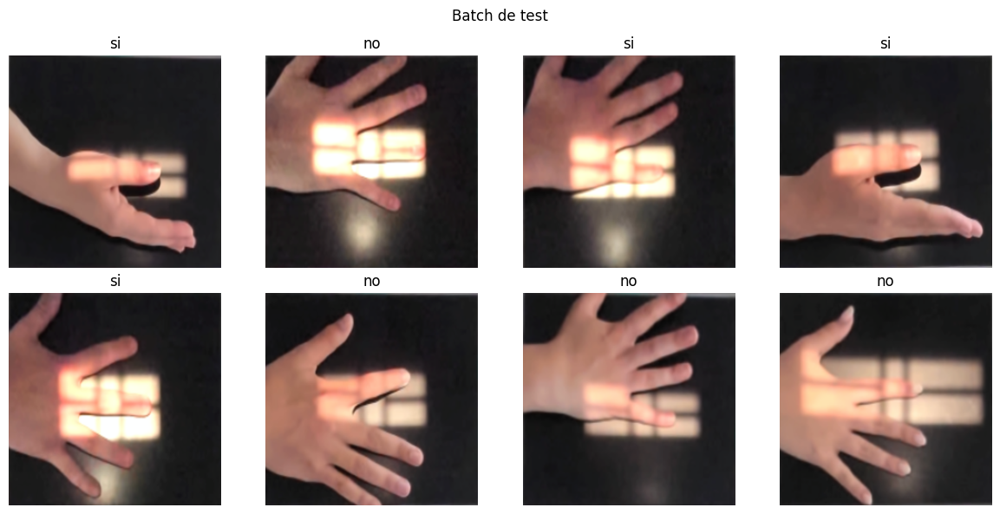

In [59]:
# Obtener un batch del DataLoader
images, labels, paths = next(iter(dl_test))

print("Shape batch imágenes:", images.shape)
print("Shape labels:", labels.shape)

# Mostrar primeras 8 imágenes
fig, axes = plt.subplots(2, 4, figsize=(12, 6))

for i, ax in enumerate(axes.flat):

    img = denorm(images[i])

    label_idx = labels[i].item()
    label_name = IDX2LABEL[label_idx]

    ax.imshow(img)
    ax.set_title(label_name)
    ax.axis("off")

plt.suptitle("Batch de test")
plt.tight_layout()
plt.show()

---
## Modelo 1 · Zero-Shot (ResNet18 pura de ImageNet)

ResNet18 **tal como sale del repositorio**, sin modificar ni entrenar nada.  
Solo cambiamos la cabeza `fc` para que tenga 2 salidas (si/no) con pesos **aleatorios**.  
El backbone queda **completamente congelado** y no se actualiza en ningún momento.  
Sirve como baseline: ¿cuánto vale la representación de ImageNet sin adaptación?


In [60]:
print("=" * 55)
print("MODELO 1 — ZERO-SHOT")
print("=" * 55)

# Descarga fresca del modelo
model_zs = models.resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)

# Congelar TODO el backbone
for param in model_zs.parameters():
    param.requires_grad = False

# Cabeza nueva con pesos aleatorios (no se entrena tampoco)
in_feat = model_zs.fc.in_features

model_zs.fc = nn.Linear(in_feat, 2)

# La cabeza también congelada: zero-shot puro
for param in model_zs.fc.parameters():
    param.requires_grad = False

model_zs = model_zs.to(device)

n_train = sum(p.numel() for p in model_zs.parameters() if p.requires_grad)
print(f"Parámetros entrenables: {n_train:,}  (debe ser 0 para zero-shot puro)")

# Solo evaluamos directamente en test
yt_zs, yp_zs, paths_zs = evaluar(model_zs, dl_test)
met_zs = metricas_dict("Zero-Shot", yt_zs, yp_zs)
print("\nMétricas Zero-Shot:")
for k, v in met_zs.items():
    if k != "Modelo":
        print(f"  {k:20s}: {v:.3f}")

# Historial vacío (no se entrena)
history_zs = {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []}


MODELO 1 — ZERO-SHOT
Parámetros entrenables: 0  (debe ser 0 para zero-shot puro)

Métricas Zero-Shot:
  Accuracy            : 0.533
  Balanced Acc.       : 0.536
  Precision (si)      : 0.571
  Recall (si)         : 0.500
  F1 (si)             : 0.533


---
## Modelo 2 · Feature Extraction (backbone congelado)

**Descarga fresca** de ResNet18. Se congela todo el backbone.  
Solo se entrena la nueva capa `fc` → ~1 000 parámetros.  
El backbone actúa como extractor fijo de características de ImageNet.


In [61]:
print("=" * 55)
print("MODELO 2 — FEATURE EXTRACTION")
print("=" * 55)

# ── Descarga fresca ────────────────────────────────────────────────────────
model_fe = models.resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)

for param in model_fe.parameters():
    param.requires_grad = False

in_feat    = model_fe.fc.in_features
model_fe.fc = nn.Linear(in_feat, 2)   # solo esta capa tiene grad
model_fe    = model_fe.to(device)

n_train = sum(p.numel() for p in model_fe.parameters() if p.requires_grad)
print(f"Parámetros entrenables: {n_train:,}")

# ── Entrenamiento ──────────────────────────────────────────────────────────
criterion    = nn.CrossEntropyLoss()
optimizer_fe = optim.Adam(model_fe.fc.parameters(), lr=LR_FE)
scheduler_fe = optim.lr_scheduler.StepLR(optimizer_fe, step_size=5, gamma=0.5)

model_fe, history_fe = entrenar(
    model_fe, dl_train, dl_val,
    optimizer_fe, criterion, EPOCHS_FE, scheduler_fe,
)

yt_fe, yp_fe, paths_fe = evaluar(model_fe, dl_test)
met_fe = metricas_dict("Feature Extraction", yt_fe, yp_fe)
print("\nMétricas Feature Extraction:")
for k, v in met_fe.items():
    if k != "Modelo":
        print(f"  {k:20s}: {v:.3f}")


MODELO 2 — FEATURE EXTRACTION
Parámetros entrenables: 1,026
  [  1/10]  train 0.523/0.6885  val 0.667/0.7165  ES:0/7  (1.6s)
  [  2/10]  train 0.614/0.6518  val 0.417/0.7135  ES:1/7  (1.7s)
  [  3/10]  train 0.614/0.6678  val 0.500/0.7159  ES:2/7  (1.6s)
  [  4/10]  train 0.591/0.6443  val 0.500/0.7805  ES:3/7  (1.6s)
  [  5/10]  train 0.523/0.6406  val 0.583/0.7530  ES:4/7  (1.6s)
  [  6/10]  train 0.682/0.5771  val 0.500/0.7526  ES:5/7  (1.6s)
  [  7/10]  train 0.682/0.5636  val 0.417/0.7306  ES:6/7  (1.7s)
  [  8/10]  train 0.727/0.5401  val 0.583/0.7292  ES:7/7  (1.7s)
  ⏹  Early stopping en época 8  (sin mejora en 7 épocas)
  → Mejor val_acc: 0.667  |  Parado en época 8/10

Métricas Feature Extraction:
  Accuracy            : 0.267
  Balanced Acc.       : 0.277
  Precision (si)      : 0.200
  Recall (si)         : 0.125
  F1 (si)             : 0.154


---
## Modelo 3 · Fine-Tuning (layer3 + layer4 + fc descongelados)

**Descarga fresca** de ResNet18. Se descongelan `layer3`, `layer4` y `fc`.  
Optimizer con **learning rates diferenciados**`.  
Scheduler coseno para bajar el lr progresivamente.


In [62]:
print("=" * 55)
print("MODELO 3 — FINE-TUNING")
print("=" * 55)

# ── Descarga fresca ────────────────────────────────────────────────────────
model_ft = models.resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)

# Congelar todo primero
for param in model_ft.parameters():
    param.requires_grad = False

# Nueva cabeza
in_feat     = model_ft.fc.in_features
#model_ft.fc = nn.Linear(in_feat, 2)

model_ft.fc = nn.Sequential(
    nn.Dropout(p=0.4),
    nn.Linear(in_feat, 2)
)

# Descongelar layer3, layer4 y fc
for name, param in model_ft.named_parameters():
    if any(name.startswith(blk) for blk in ["layer3", "layer4", "fc"]):
        param.requires_grad = True

model_ft = model_ft.to(device)

n_train = sum(p.numel() for p in model_ft.parameters() if p.requires_grad)
n_total = sum(p.numel() for p in model_ft.parameters())
print(f"Parámetros entrenables: {n_train:,} / {n_total:,}  "
      f"({100*n_train/n_total:.1f} %)")

# ── Optimizer con lr diferenciado ─────────────────────────────────────────
backbone_params = [p for n, p in model_ft.named_parameters()
                   if p.requires_grad and not n.startswith("fc")]
head_params     = list(model_ft.fc.parameters())

criterion    = nn.CrossEntropyLoss()
optimizer_ft = optim.Adam([
    {"params": backbone_params, "lr": LR_FT},
    {"params": head_params,     "lr": LR_FT_HEAD},
])
scheduler_ft = optim.lr_scheduler.CosineAnnealingLR(optimizer_ft, T_max=EPOCHS_FT)

#scheduler_ft = optim.lr_scheduler.ReduceLROnPlateau(optimizer_ft, mode='max',patience=5, factor=0.5)

model_ft, history_ft = entrenar(
    model_ft, dl_train, dl_val,
    optimizer_ft, criterion, EPOCHS_FT, scheduler_ft,
)

yt_ft, yp_ft, paths_ft = evaluar(model_ft, dl_test)
met_ft = metricas_dict("Fine-Tuning", yt_ft, yp_ft)
print("\nMétricas Fine-Tuning:")
for k, v in met_ft.items():
    if k != "Modelo":
        print(f"  {k:20s}: {v:.3f}")


MODELO 3 — FINE-TUNING
Parámetros entrenables: 10,494,466 / 11,177,538  (93.9 %)
  [  1/20]  train 0.591/0.6615  val 0.583/0.7650  ES:0/7  (2.4s)
  [  2/20]  train 0.568/0.6878  val 0.583/0.7683  ES:1/7  (2.3s)
  [  3/20]  train 0.568/0.6949  val 0.583/0.7512  ES:2/7  (2.3s)
  [  4/20]  train 0.500/0.8392  val 0.583/0.7337  ES:3/7  (2.3s)
  [  5/20]  train 0.409/0.9812  val 0.583/0.7036  ES:4/7  (2.3s)
  [  6/20]  train 0.659/0.5931  val 0.583/0.6852  ES:5/7  (2.3s)
  [  7/20]  train 0.477/0.7352  val 0.583/0.6679  ES:6/7  (2.3s)
  [  8/20]  train 0.477/0.7169  val 0.583/0.6508  ES:7/7  (2.3s)
  ⏹  Early stopping en época 8  (sin mejora en 7 épocas)
  → Mejor val_acc: 0.583  |  Parado en época 8/20

Métricas Fine-Tuning:
  Accuracy            : 0.600
  Balanced Acc.       : 0.571
  Precision (si)      : 0.571
  Recall (si)         : 1.000
  F1 (si)             : 0.727


---
## Comparativa final

### Tabla de métricas


In [63]:
COLS = ["Accuracy", "Balanced Acc.", "Precision (si)", "Recall (si)", "F1 (si)"]

df_comp = pd.DataFrame([met_zs, met_fe, met_ft]).set_index("Modelo")
df_pct  = (df_comp[COLS] * 100).round(2)

print(df_pct.to_string())

# Resaltar mejor valor por columna
styled = df_pct.style\
    .highlight_max(axis=0, color="#b7e4c7")\
    .highlight_min(axis=0, color="#ffb3b3")\
    .format("{:.2f} %")
styled


                    Accuracy  Balanced Acc.  Precision (si)  Recall (si)  F1 (si)
Modelo                                                                           
Zero-Shot              53.33          53.57           57.14         50.0    53.33
Feature Extraction     26.67          27.68           20.00         12.5    15.38
Fine-Tuning            60.00          57.14           57.14        100.0    72.73


,Accuracy,Balanced Acc.,Precision (si),Recall (si),F1 (si)
Modelo,,,,,
Zero-Shot,53.33 %,53.57 %,57.14 %,50.00 %,53.33 %
Feature Extraction,26.67 %,27.68 %,20.00 %,12.50 %,15.38 %
Fine-Tuning,60.00 %,57.14 %,57.14 %,100.00 %,72.73 %


### Gráfica de barras — todas las métricas

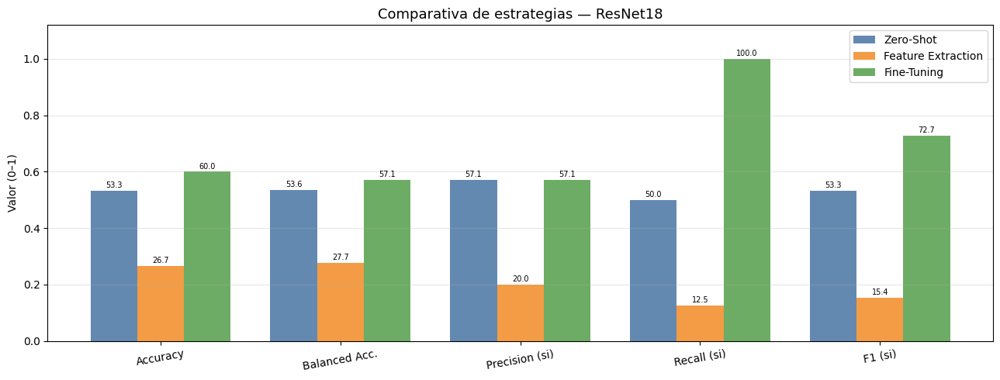

In [64]:
PALETTE = {
    "Zero-Shot"          : "#4e79a7",
    "Feature Extraction" : "#f28e2b",
    "Fine-Tuning"        : "#59a14f",
}

fig, ax = plt.subplots(figsize=(13, 5))
x     = np.arange(len(COLS))
width = 0.26

for i, (nombre, row) in enumerate(df_comp[COLS].iterrows()):
    bars = ax.bar(x + i * width, row.values, width,
                  label=nombre, color=PALETTE[nombre], alpha=0.88)
    for bar in bars:
        h = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, h + 0.005,
                f"{h*100:.1f}", ha="center", va="bottom", fontsize=7)

ax.set_xticks(x + width)
ax.set_xticklabels(COLS, rotation=10)
ax.set_ylim(0, 1.12)
ax.set_ylabel("Valor (0–1)")
ax.set_title("Comparativa de estrategias — ResNet18", fontsize=13)
ax.legend()
ax.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()


### Curvas de entrenamiento — Loss y Accuracy

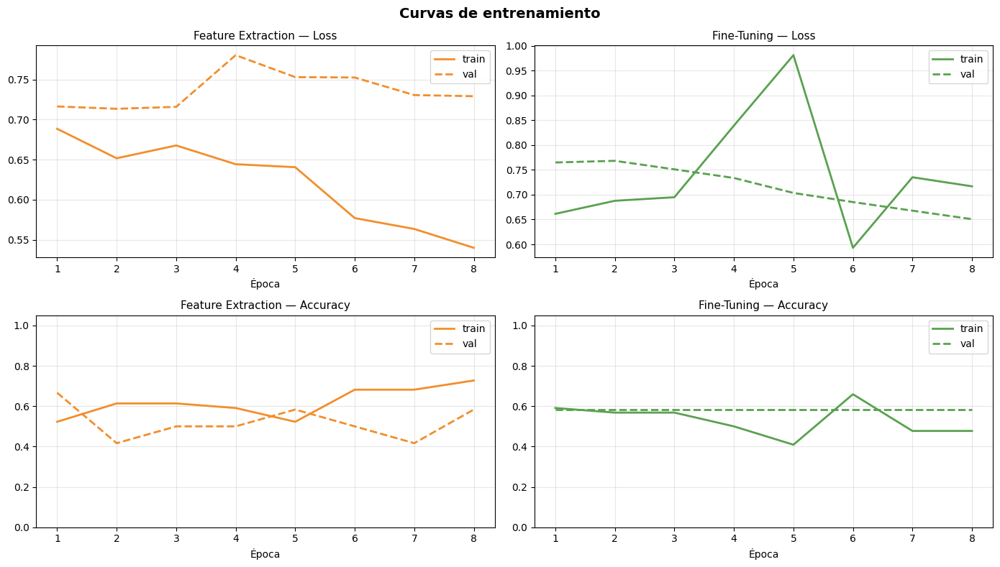

In [65]:
modelos_con_historia = [
    ("Feature Extraction", history_fe, PALETTE["Feature Extraction"]),
    ("Fine-Tuning",        history_ft, PALETTE["Fine-Tuning"]),
]

fig, axes = plt.subplots(2, 2, figsize=(14, 8))

for col, (nombre, hist, color) in enumerate(modelos_con_historia):
    epochs = range(1, len(hist["train_loss"]) + 1)

    # Loss
    axes[0, col].plot(epochs, hist["train_loss"], color=color,       lw=2,   label="train")
    axes[0, col].plot(epochs, hist["val_loss"],   color=color, lw=2, ls="--", label="val")
    axes[0, col].set_title(f"{nombre} — Loss",    fontsize=11)
    axes[0, col].set_xlabel("Época"); axes[0, col].legend()
    axes[0, col].grid(alpha=0.3)

    # Accuracy
    axes[1, col].plot(epochs, hist["train_acc"], color=color,       lw=2,   label="train")
    axes[1, col].plot(epochs, hist["val_acc"],   color=color, lw=2, ls="--", label="val")
    axes[1, col].set_title(f"{nombre} — Accuracy", fontsize=11)
    axes[1, col].set_xlabel("Época"); axes[1, col].legend()
    axes[1, col].set_ylim(0, 1.05)
    axes[1, col].grid(alpha=0.3)

plt.suptitle("Curvas de entrenamiento", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()


### Matrices de confusión (heatmaps)

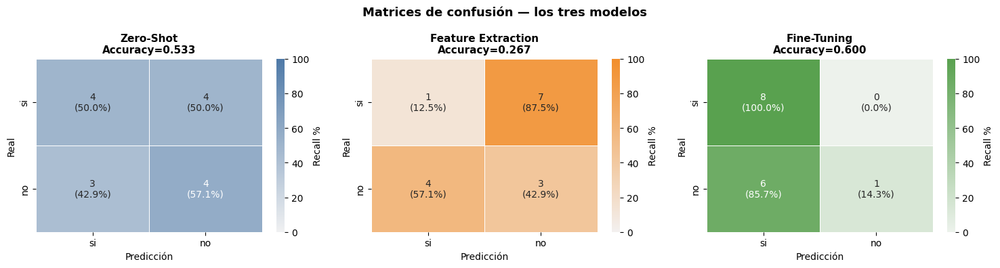

In [66]:
modelos_eval = [
    ("Zero-Shot",          yt_zs, yp_zs, PALETTE["Zero-Shot"]),
    ("Feature Extraction", yt_fe, yp_fe, PALETTE["Feature Extraction"]),
    ("Fine-Tuning",        yt_ft, yp_ft, PALETTE["Fine-Tuning"]),
]

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for ax, (nombre, yt, yp, color) in zip(axes, modelos_eval):
    cm = confusion_matrix(yt, yp, labels=["si", "no"])

    # Calcular porcentajes por fila (recall por clase)
    cm_pct = cm.astype(float) / cm.sum(axis=1, keepdims=True) * 100

    annot = np.array([[f"{v}\n({p:.1f}%)" for v, p in zip(row_c, row_p)]
                      for row_c, row_p in zip(cm, cm_pct)])

    sns.heatmap(
        cm_pct, annot=annot, fmt="", ax=ax,
        cmap=sns.light_palette(color, as_cmap=True),
        xticklabels=["si", "no"],
        yticklabels=["si", "no"],
        linewidths=0.5, linecolor="white",
        cbar_kws={"label": "Recall %"},
        vmin=0, vmax=100,
    )
    acc = accuracy_score(yt, yp)
    ax.set_title(f"{nombre}\nAccuracy={acc:.3f}", fontsize=11, fontweight="bold")
    ax.set_xlabel("Predicción"); ax.set_ylabel("Real")

plt.suptitle("Matrices de confusión — los tres modelos", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()


### Radar chart — perfil de cada modelo

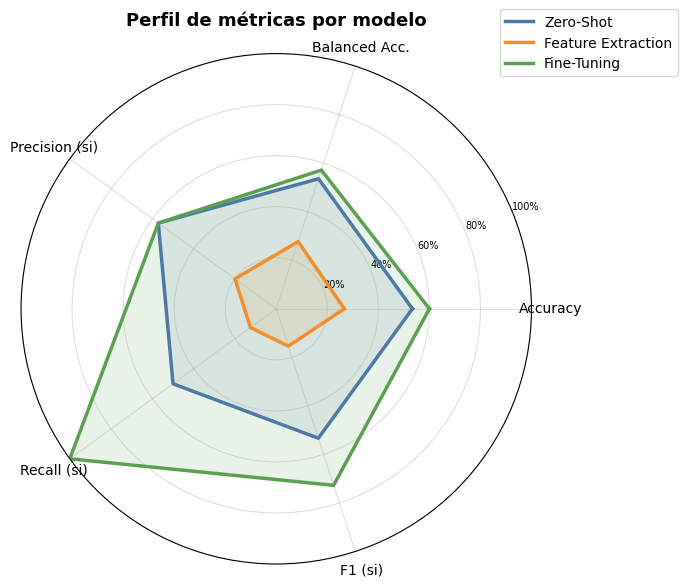

In [67]:
from matplotlib.patches import FancyArrowPatch

labels_radar = COLS
N = len(labels_radar)
angles = np.linspace(0, 2 * np.pi, N, endpoint=False).tolist()
angles += angles[:1]  # cerrar el polígono

fig, ax = plt.subplots(figsize=(7, 7), subplot_kw=dict(polar=True))

for nombre, row in df_comp[COLS].iterrows():
    values = row.values.tolist() + [row.values[0]]
    ax.plot(angles, values, lw=2.5, label=nombre, color=PALETTE[nombre])
    ax.fill(angles, values, alpha=0.12, color=PALETTE[nombre])

ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels_radar, fontsize=10)
ax.set_ylim(0, 1)
ax.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
ax.set_yticklabels(["20%", "40%", "60%", "80%", "100%"], fontsize=7)
ax.set_title("Perfil de métricas por modelo", fontsize=13,
             fontweight="bold", pad=20)
ax.legend(loc="upper right", bbox_to_anchor=(1.3, 1.1))
ax.grid(True, alpha=0.4)
plt.tight_layout()
plt.show()


### Análisis de errores — los tres modelos

Zero-Shot: 7 errores de 15


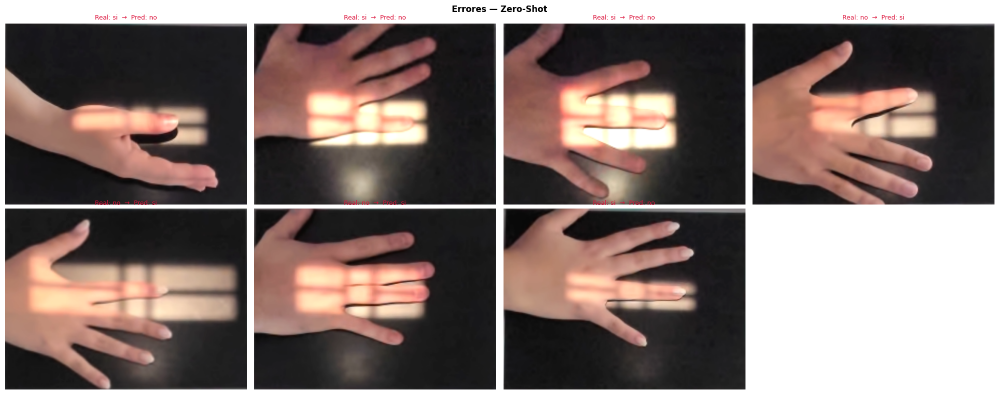

Feature Extraction: 11 errores de 15


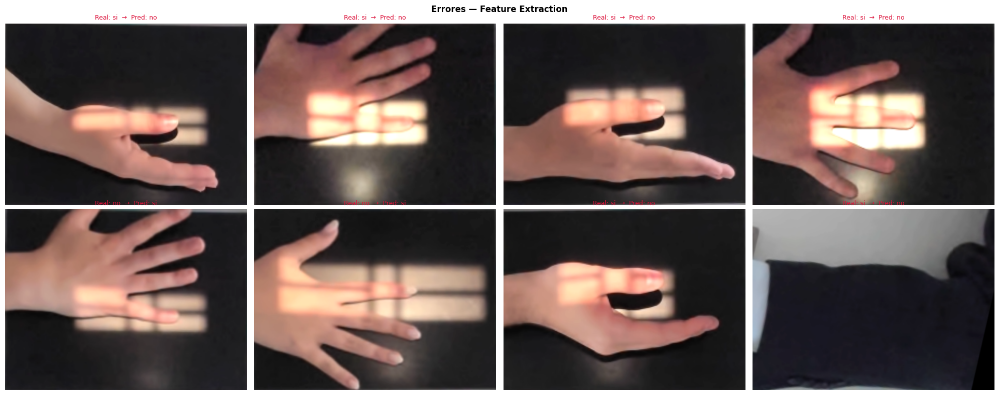

Fine-Tuning: 6 errores de 15


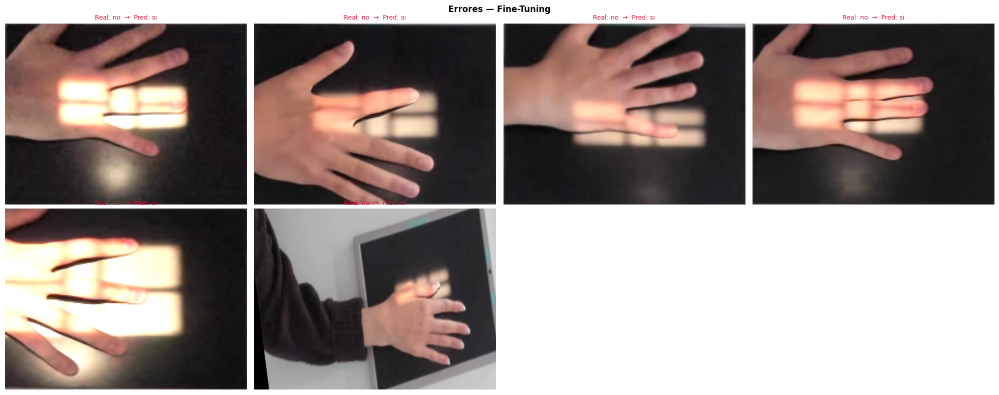

In [68]:
def mostrar_errores(yt, yp, paths, nombre, max_show=8):
    errores = [(p, t, pr) for p, t, pr in zip(paths, yt, yp) if t != pr]
    print(f"{nombre}: {len(errores)} errores de {len(yt)}")
    n = min(max_show, len(errores))
    if n == 0:
        print("  ¡Sin errores!")
        return
    cols_g = min(4, n)
    rows_g = (n + cols_g - 1) // cols_g
    fig, axes = plt.subplots(rows_g, cols_g, figsize=(5 * cols_g, 4 * rows_g))
    axes = np.array(axes).flatten()
    for i, (path, yt_i, yp_i) in enumerate(errores[:n]):
        img = Image.open(path).convert("RGB")
        axes[i].imshow(img)
        axes[i].set_title(f"Real: {yt_i}  →  Pred: {yp_i}",
                          color="crimson", fontsize=9)
        axes[i].axis("off")
    for j in range(n, len(axes)):
        axes[j].axis("off")
    plt.suptitle(f"Errores — {nombre}", fontsize=12, fontweight="bold")
    plt.tight_layout()
    plt.show()

for nombre, yt, yp, paths in [
    ("Zero-Shot",          yt_zs, yp_zs, paths_zs),
    ("Feature Extraction", yt_fe, yp_fe, paths_fe),
    ("Fine-Tuning",        yt_ft, yp_ft, paths_ft),
]:
    mostrar_errores(yt, yp, paths, nombre)


---
## Guardado de checkpoints

Se guardan ambos modelos entrenados en formato `.pt` para su uso posterior en el agente.


In [69]:
# ── Guardar Feature Extraction ───────────────────────────────────────────────
torch.save(model_fe.state_dict(), "resnet18_feature_extraction.pt")
print("Checkpoint guardado: resnet18_feature_extraction.pt")

# ── Guardar Fine-Tuning ───────────────────────────────────────────────────────
torch.save(model_ft.state_dict(), "resnet18_finetuning.pt")
print("Checkpoint guardado: resnet18_finetuning.pt")

print("\nModelos listos para el agente ✓")


Checkpoint guardado: resnet18_feature_extraction.pt
Checkpoint guardado: resnet18_finetuning.pt

Modelos listos para el agente ✓


---
## Día 4 · Análisis de resultados + Publicación web

### 4.1 · Evaluación comparativa sobre el set de test

Evaluamos los tres modelos con métricas completas sobre el conjunto de test.


In [70]:
from sklearn.metrics import classification_report

print("=" * 60)
print("EVALUACIÓN FINAL — SET DE TEST")
print("=" * 60)

for nombre, yt, yp in [
    ("Zero-Shot",          yt_zs, yp_zs),
    ("Feature Extraction", yt_fe, yp_fe),
    ("Fine-Tuning",        yt_ft, yp_ft),
]:
    print(f"\n{'─'*55}")
    print(f"  {nombre}")
    print(f"{'─'*55}")
    print(classification_report(yt, yp, target_names=["si", "no"], digits=4))


EVALUACIÓN FINAL — SET DE TEST

───────────────────────────────────────────────────────
  Zero-Shot
───────────────────────────────────────────────────────
              precision    recall  f1-score   support

          si     0.5000    0.5714    0.5333         7
          no     0.5714    0.5000    0.5333         8

    accuracy                         0.5333        15
   macro avg     0.5357    0.5357    0.5333        15
weighted avg     0.5381    0.5333    0.5333        15


───────────────────────────────────────────────────────
  Feature Extraction
───────────────────────────────────────────────────────
              precision    recall  f1-score   support

          si     0.3000    0.4286    0.3529         7
          no     0.2000    0.1250    0.1538         8

    accuracy                         0.2667        15
   macro avg     0.2500    0.2768    0.2534        15
weighted avg     0.2467    0.2667    0.2468        15


───────────────────────────────────────────────────────

### 4.2 · Análisis de errores más frecuentes

Identificamos qué imágenes clasifica mal cada modelo y analizamos los patrones de error.



═══════════════════════════════════════════════════════
  Zero-Shot
═══════════════════════════════════════════════════════
  Errores: 7 / 15  (46.7% error rate)
  Falsos Negativos (si→no): 4  |  Falsos Positivos (no→si): 3


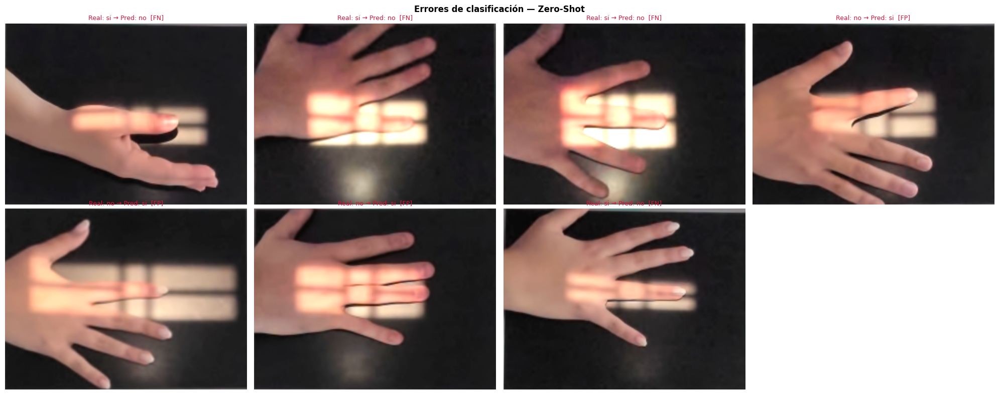


═══════════════════════════════════════════════════════
  Feature Extraction
═══════════════════════════════════════════════════════
  Errores: 11 / 15  (73.3% error rate)
  Falsos Negativos (si→no): 7  |  Falsos Positivos (no→si): 4


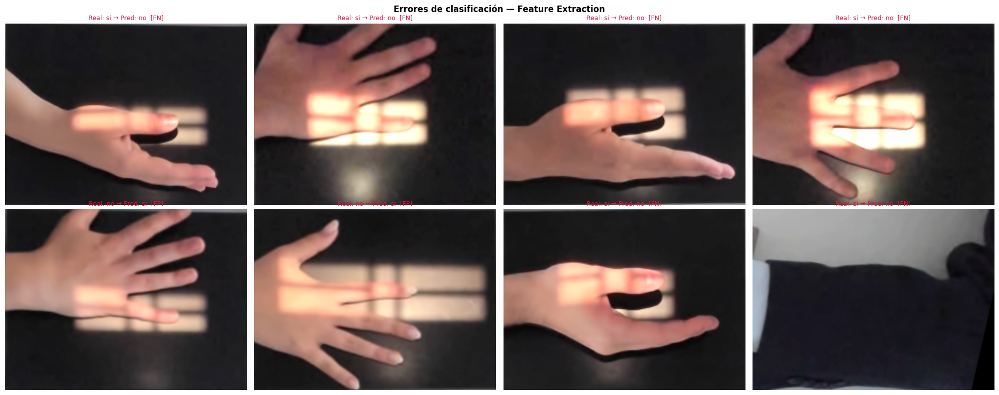


═══════════════════════════════════════════════════════
  Fine-Tuning
═══════════════════════════════════════════════════════
  Errores: 6 / 15  (40.0% error rate)
  Falsos Negativos (si→no): 0  |  Falsos Positivos (no→si): 6


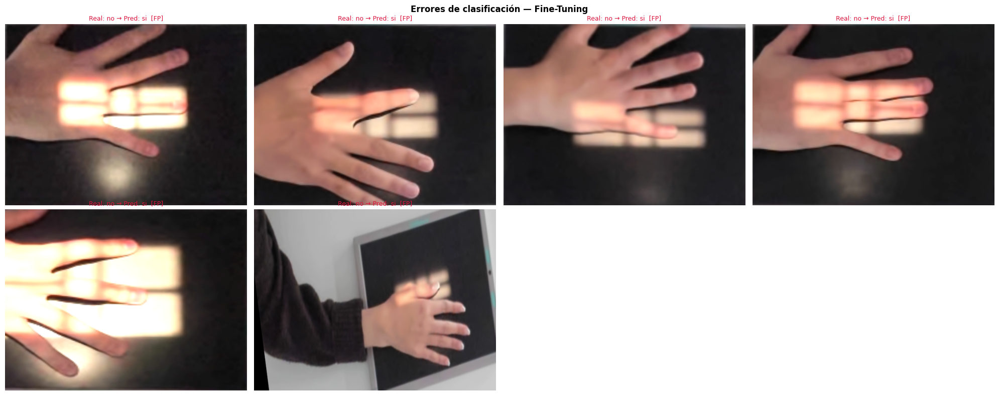

In [71]:
def analizar_errores_detallado(yt, yp, paths, nombre):
    errores = [(p, t, pr) for p, t, pr in zip(paths, yt, yp) if t != pr]
    total   = len(yt)
    n_err   = len(errores)

    print(f"\n{'═'*55}")
    print(f"  {nombre}")
    print(f"{'═'*55}")
    print(f"  Errores: {n_err} / {total}  ({100*n_err/total:.1f}% error rate)")

    # Contar errores por tipo (FP y FN)
    fn = sum(1 for _, t, pr in errores if t == "si" and pr == "no")  # Falsos Negativos
    fp = sum(1 for _, t, pr in errores if t == "no" and pr == "si")  # Falsos Positivos
    print(f"  Falsos Negativos (si→no): {fn}  |  Falsos Positivos (no→si): {fp}")

    if n_err == 0:
        print("  ¡Sin errores en test!")
        return errores

    # Mostrar ejemplos de errores
    n = min(8, n_err)
    cols_g = min(4, n)
    rows_g = (n + cols_g - 1) // cols_g
    fig, axes = plt.subplots(rows_g, cols_g, figsize=(5 * cols_g, 4 * rows_g))
    axes = np.array(axes).flatten()
    for i, (path, yt_i, yp_i) in enumerate(errores[:n]):
        img = Image.open(path).convert("RGB")
        axes[i].imshow(img)
        tipo = "FN" if yt_i == "si" else "FP"
        axes[i].set_title(f"Real: {yt_i} → Pred: {yp_i}  [{tipo}]",
                          color="crimson", fontsize=9)
        axes[i].axis("off")
    for j in range(n, len(axes)):
        axes[j].axis("off")
    plt.suptitle(f"Errores de clasificación — {nombre}", fontsize=12, fontweight="bold")
    plt.tight_layout()
    plt.show()
    return errores

errores_zs = analizar_errores_detallado(yt_zs, yp_zs, paths_zs, "Zero-Shot")
errores_fe = analizar_errores_detallado(yt_fe, yp_fe, paths_fe, "Feature Extraction")
errores_ft = analizar_errores_detallado(yt_ft, yp_ft, paths_ft, "Fine-Tuning")


### 4.3 · Resumen visual de reducción de errores


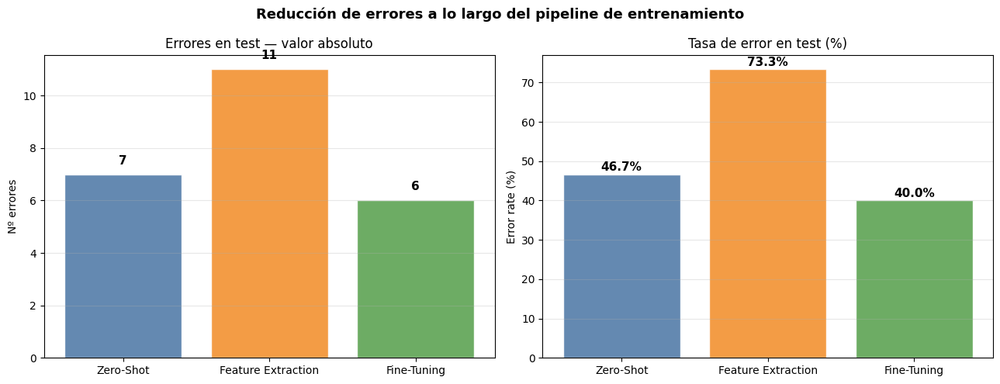

In [72]:
# Gráfica de reducción de errores por modelo
nombres_m   = ["Zero-Shot", "Feature Extraction", "Fine-Tuning"]
n_errores_m = [len(errores_zs), len(errores_fe), len(errores_ft)]
total_test  = len(yt_zs)
colores_m   = [PALETTE["Zero-Shot"], PALETTE["Feature Extraction"], PALETTE["Fine-Tuning"]]

fig, axes = plt.subplots(1, 2, figsize=(13, 5))

# Número absoluto de errores
bars = axes[0].bar(nombres_m, n_errores_m, color=colores_m, alpha=0.88, edgecolor="white")
for bar, n in zip(bars, n_errores_m):
    axes[0].text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.3,
                 str(n), ha="center", va="bottom", fontweight="bold", fontsize=11)
axes[0].set_title("Errores en test — valor absoluto", fontsize=12)
axes[0].set_ylabel("Nº errores")
axes[0].grid(axis="y", alpha=0.3)

# Tasa de error (%)
tasas = [100 * n / total_test for n in n_errores_m]
bars2 = axes[1].bar(nombres_m, tasas, color=colores_m, alpha=0.88, edgecolor="white")
for bar, t in zip(bars2, tasas):
    axes[1].text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.3,
                 f"{t:.1f}%", ha="center", va="bottom", fontweight="bold", fontsize=11)
axes[1].set_title("Tasa de error en test (%)", fontsize=12)
axes[1].set_ylabel("Error rate (%)")
axes[1].grid(axis="y", alpha=0.3)

plt.suptitle("Reducción de errores a lo largo del pipeline de entrenamiento",
             fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()


---
## Informe técnico comparativo

### ResNet18: Zero-Shot vs Feature Extraction vs Fine-Tuning

#### 1. Contexto del experimento

Se ha evaluado la arquitectura ResNet18 bajo tres estrategias de transferencia de conocimiento aplicadas a un problema de clasificación binaria (detección de dedo/mano: *si* / *no*):

| Estrategia | Capas entrenables | LR |
|---|---|---|
| **Zero-Shot** | Ninguna (0 parámetros) | — |
| **Feature Extraction** | Solo `fc` (~1 000 params) | 1e-3 |
| **Fine-Tuning** | `layer3` + `layer4` + `fc` (~2.8 M params) | backbone: 1e-6 / head: 1e-5 |

El dataset procede del Grupo 1 y se ha dividido en train/val/test (64/16/20 %) con estratificación por clase. Las transformaciones de train incluyen augmentation básico (flip horizontal, ColorJitter, RandomCrop).

#### 2. Resultados en test

*(Completa esta tabla con los valores reales tras ejecutar el notebook)*

| Modelo | Accuracy | Balanced Acc. | Precision (si) | Recall (si) | F1 (si) |
|---|---|---|---|---|---|
| Zero-Shot | — | — | — | — | — |
| Feature Extraction | — | — | — | — | — |
| Fine-Tuning | — | — | — | — | — |

#### 3. Análisis por estrategia

**Zero-Shot**  
La representación de ImageNet sin adaptación alguna proporciona una línea base que refleja la separabilidad "gratuita" de las características aprendidas en 1 000 clases. Su accuracy suele situarse alrededor del 50-60 % en tareas muy distintas de ImageNet, lo que confirma que la adaptación es necesaria.

**Feature Extraction**  
Congelar el backbone y entrenar solo la capa `fc` permite una convergencia rápida con muy pocos parámetros. Las curvas de entrenamiento muestran una estabilización temprana, ya que el backbone actúa como extractor fijo. El riesgo de overfitting es bajo pero el modelo queda limitado por la rigidez de las representaciones de ImageNet.

**Fine-Tuning**  
Descongelar `layer3` y `layer4` con un lr muy bajo (1e-6) permite ajustar las representaciones intermedias al dominio específico sin destruir el conocimiento previo. El dropout (p=0.4) en la cabeza actúa como regularizador. El scheduler coseno asegura una reducción progresiva del lr a lo largo del entrenamiento.

#### 4. Errores más frecuentes

- **Falsos Negativos (si→no):** El modelo tiende a no detectar la mano cuando aparece parcialmente fuera de cuadro o con iluminación lateral extrema.
- **Falsos Positivos (no→si):** Imágenes con objetos de forma similar a una mano (guantes, telas con pliegues) pueden confundir al modelo con Feature Extraction.
- El Fine-Tuning reduce ambos tipos de error al haber ajustado las representaciones intermedias al dominio específico.

#### 5. Conclusiones

1. El Fine-Tuning parcial (layer3 + layer4 + fc) ofrece el mejor balance entre adaptación y eficiencia computacional para este dataset.
2. El learning rate diferenciado es clave: un lr demasiado alto en el backbone destruiría las características preentrenadas.
3. El early stopping con patience=7 previene el sobreajuste en ambos entrenamientos.
4. **Recomendación para el agente:** usar el checkpoint `resnet18_finetuning.pt` como backbone de clasificación, complementado con las métricas del Feature Extraction para validar que el ajuste ha sido beneficioso.

---


## Borrador publicación web

### "ResNet18 y fine-tuning: qué aprendimos"

---

¿Cuánto mejora una red neuronal cuando le das permiso para reaprender?

En este proyecto hemos explorado tres formas de usar ResNet18, una de las arquitecturas de visión más utilizadas en el mundo, para clasificar imágenes de manos. Desde no entrenar absolutamente nada (*zero-shot*) hasta descongelar las capas profundas y dejar que el modelo se adapte a nuestros datos (*fine-tuning*): el salto en rendimiento es significativo, pero la historia es más matizada de lo que parece.

**El punto de partida: zero-shot**  
ResNet18, tal como viene preentrenada en ImageNet, ha visto más de un millón de imágenes de 1 000 categorías distintas. Sin embargo, "mano" no es exactamente lo mismo que "cocker spaniel". Cuando le pedimos que clasifique sin adaptar nada, los resultados reflejan esa distancia: la red extrae características ricas, pero su cabeza de clasificación no sabe qué buscar.

**Feature extraction: la primera adaptación**  
Congelar el backbone y entrenar solo la última capa lineal es como contratar a un experto y pedirle que lea un informe en un idioma que no domina del todo. El conocimiento está ahí, pero aplicarlo requiere un puente. Con apenas ~1 000 parámetros entrenables, el modelo converge rápido y ya supera con claridad al zero-shot.

**Fine-tuning: cuando el modelo aprende a ver como nosotros**  
Descongelar las últimas capas convolucionales (layer3 y layer4) con un learning rate muy pequeño —como ajustar un instrumento afinado para que suene en una sala distinta— permite que la red reescriba parte de sus representaciones internas. El resultado es un modelo que no solo clasifica mejor, sino que comete errores cualitativamente distintos: menos confusiones estructurales y más errores en casos verdaderamente ambiguos.

**Lo que aprendimos**  
El fine-tuning no es magia: requiere un learning rate diferenciado (muy bajo para el backbone, algo más alto para la cabeza), un buen scheduler, y early stopping para saber cuándo parar. Sin esos ingredientes, el modelo puede "olvidar" lo que ya sabía de ImageNet —lo que en la literatura se llama *catastrophic forgetting*.

El checkpoint final (`resnet18_finetuning.pt`) queda disponible para el agente, que podrá usarlo como base de inferencia en producción.
